# Diabetes Dataset

### Diabetes Prediction Using Machine Learning

In [129]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# Basic Data Science and ML Pipeline

In [130]:
diabetes = pd.read_csv('C:/Users/RAJ/Downloads/Saran@070697/EDA/Diabetes/Diabetes/diabetes.csv')

In [131]:
diabetes.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [132]:
diabetes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [133]:
from pandas_profiling import ProfileReport

In [134]:
ProfileReport(diabetes)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [135]:
for column in diabetes.columns:
    null_features = diabetes[column]
    null_column = (null_features==0).sum()
    print('The total number of null values in', column, 'is: ', null_column)

The total number of null values in Pregnancies is:  111
The total number of null values in Glucose is:  5
The total number of null values in BloodPressure is:  35
The total number of null values in SkinThickness is:  227
The total number of null values in Insulin is:  374
The total number of null values in BMI is:  11
The total number of null values in DiabetesPedigreeFunction is:  0
The total number of null values in Age is:  0
The total number of null values in Outcome is:  500


In [136]:
diabetes.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [137]:
diabetes_copy = diabetes.copy(deep=True)

In [138]:
diabetes_copy.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [139]:
diabetes_copy.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [140]:
diabetes_copy[['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']] = diabetes_copy[['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']].replace(0,np.nan)

In [141]:
for column in diabetes_copy.columns:
    count = diabetes_copy[column]
    null_features = (count==0).sum()
    print ('The Total Null Values In', column, 'is:', null_features)
    

The Total Null Values In Pregnancies is: 111
The Total Null Values In Glucose is: 0
The Total Null Values In BloodPressure is: 0
The Total Null Values In SkinThickness is: 0
The Total Null Values In Insulin is: 0
The Total Null Values In BMI is: 0
The Total Null Values In DiabetesPedigreeFunction is: 0
The Total Null Values In Age is: 0
The Total Null Values In Outcome is: 500


In [142]:
diabetes_copy.isna().sum()

Pregnancies                   0
Glucose                       5
BloodPressure                35
SkinThickness               227
Insulin                     374
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64

array([[<AxesSubplot:title={'center':'Pregnancies'}>,
        <AxesSubplot:title={'center':'Glucose'}>,
        <AxesSubplot:title={'center':'BloodPressure'}>],
       [<AxesSubplot:title={'center':'SkinThickness'}>,
        <AxesSubplot:title={'center':'Insulin'}>,
        <AxesSubplot:title={'center':'BMI'}>],
       [<AxesSubplot:title={'center':'DiabetesPedigreeFunction'}>,
        <AxesSubplot:title={'center':'Age'}>,
        <AxesSubplot:title={'center':'Outcome'}>]], dtype=object)

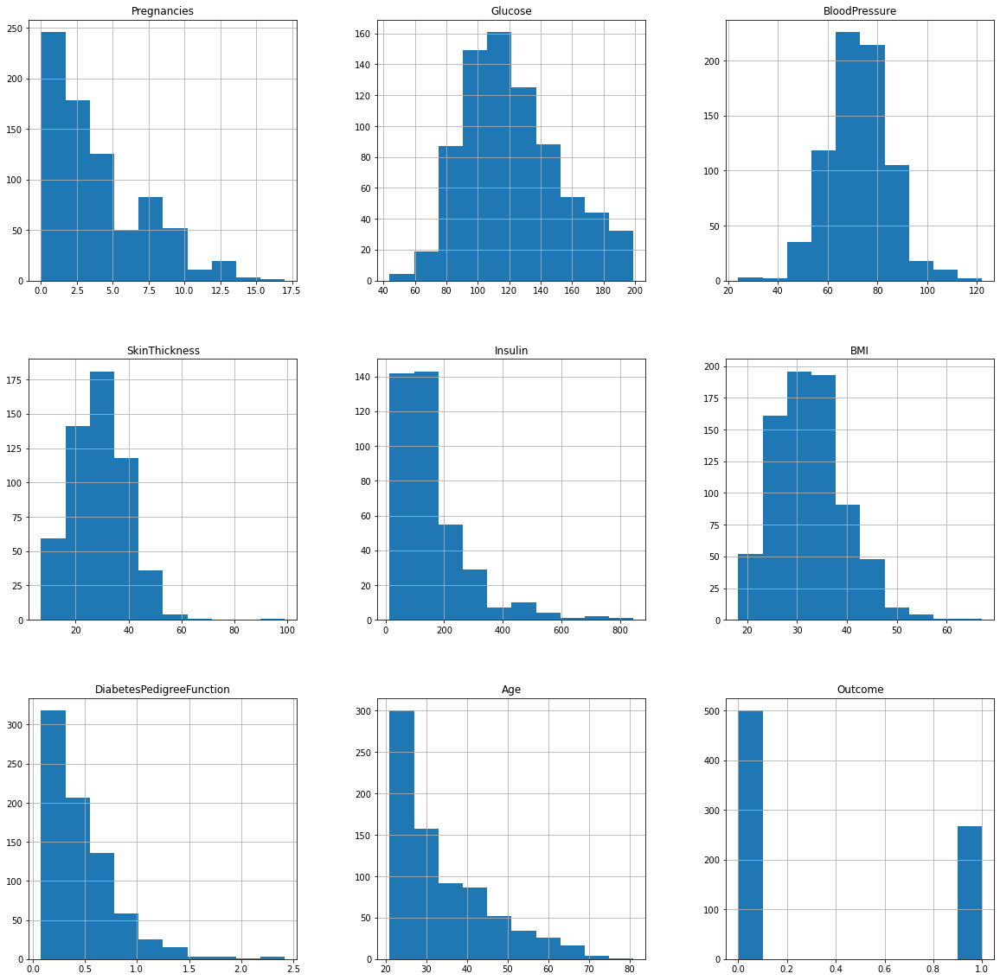

In [143]:
diabetes_copy.hist(figsize=(20,20))

In [144]:
diabetes_copy['Glucose'].fillna(diabetes_copy['Glucose'].mean(), inplace=True)

In [145]:
diabetes_copy['BloodPressure'].fillna(diabetes_copy['BloodPressure'].mean(), inplace=True)

In [146]:
diabetes_copy['SkinThickness'].fillna(diabetes_copy['SkinThickness'].mean(), inplace=True)

In [147]:
diabetes_copy['Insulin'].fillna(diabetes_copy['Insulin'].median(), inplace=True)

In [148]:
diabetes_copy['BMI'].fillna(diabetes_copy['BMI'].median(), inplace=True)

In [149]:
diabetes_copy.isna().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

<AxesSubplot:>

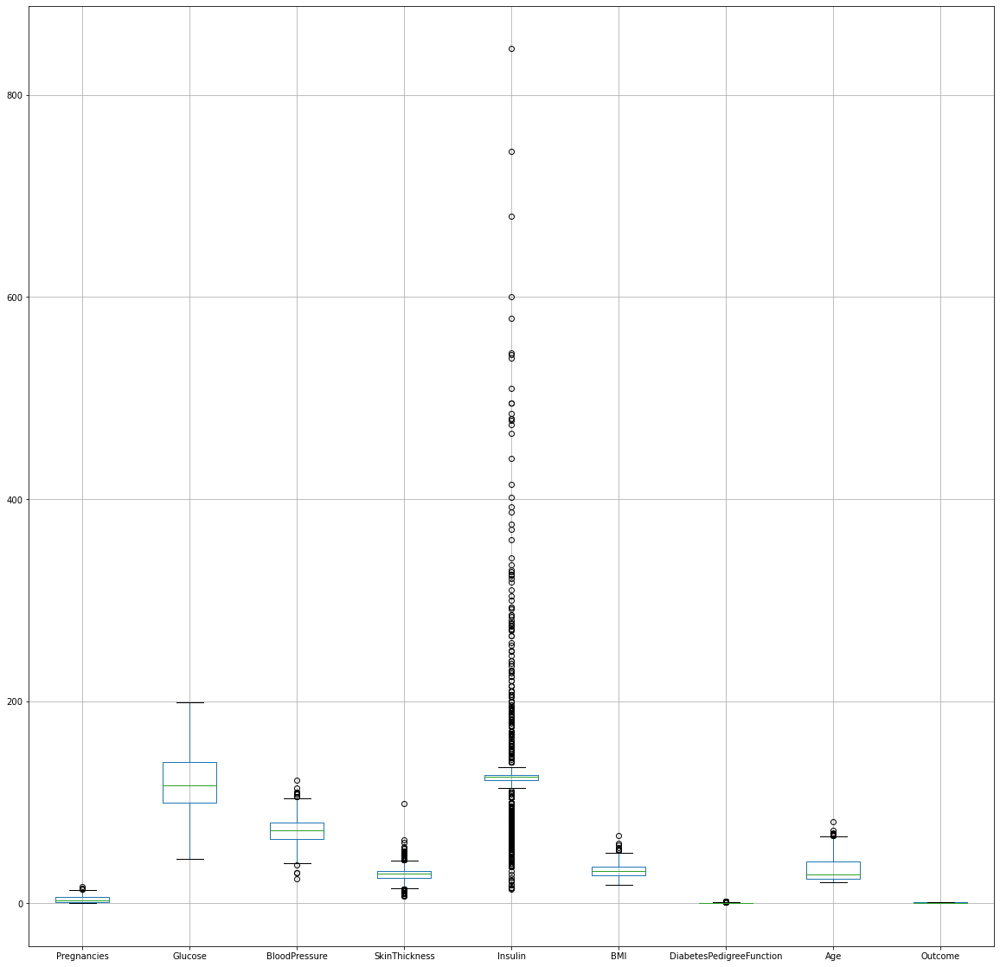

In [150]:
diabetes_copy.boxplot(figsize=(20,20))

In [151]:
import missingno as msn

<AxesSubplot:>

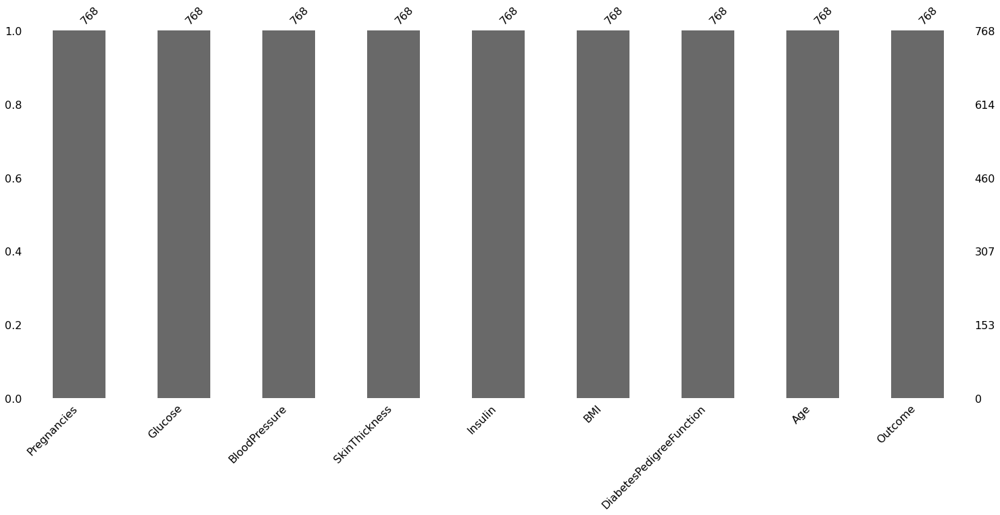

In [152]:
msn.bar(diabetes_copy)

<AxesSubplot:>

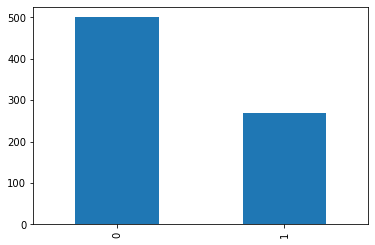

In [153]:
diabetes_copy['Outcome'].value_counts().plot(kind='bar')

In [154]:
from pandas.plotting import scatter_matrix

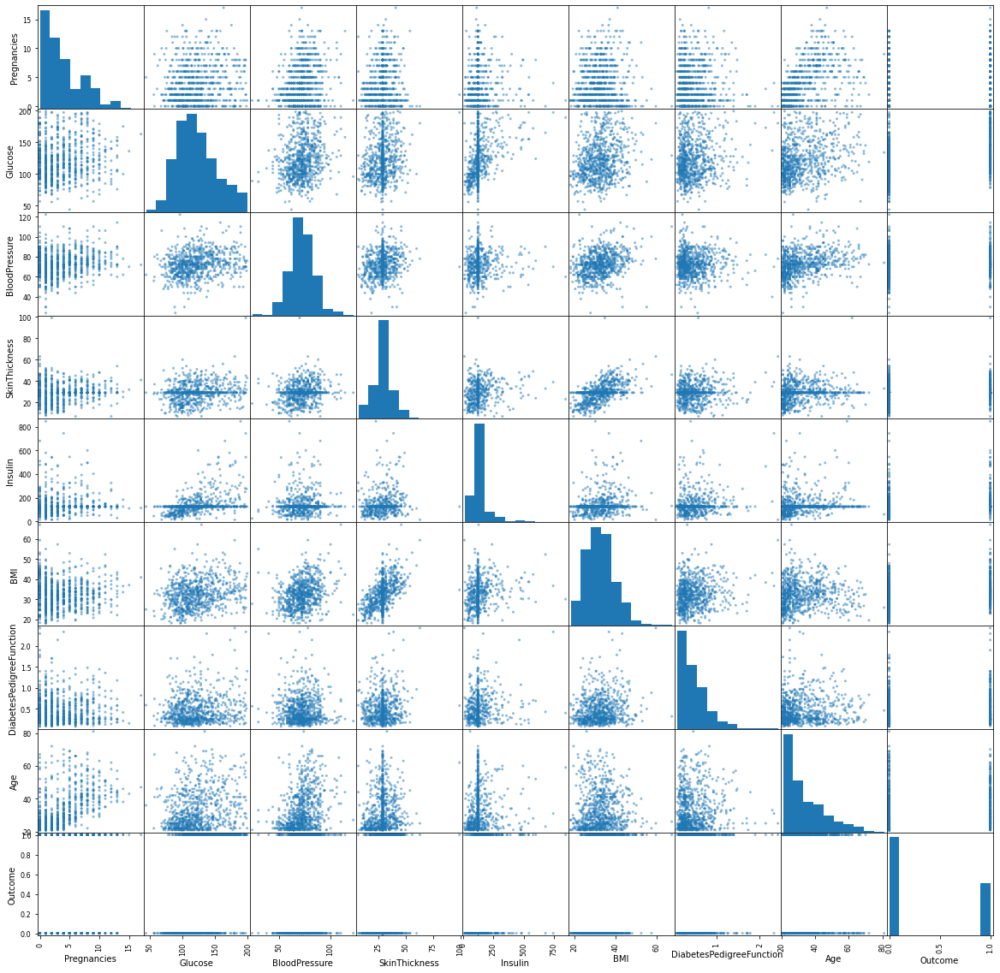

In [155]:
scatter_matrix(frame=diabetes_copy, figsize=(20,20))
plt.show()

In [156]:
diabetes_copy.corr()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
Pregnancies,1.000000,0.127911,0.208522,0.082989,0.025047,0.021559,-0.033523,0.544341,0.221898
Glucose,0.127911,1.000000,0.218367,0.192991,0.419064,0.231128,0.137060,0.266534,0.492928
BloodPressure,0.208522,0.218367,1.000000,0.192816,0.045087,0.281199,-0.002763,0.324595,0.166074
SkinThickness,0.082989,0.192991,0.192816,1.000000,0.154678,0.542438,0.100966,0.127872,0.215299
Insulin,0.025047,0.419064,0.045087,0.154678,1.000000,0.180241,0.126503,0.097101,0.203790
BMI,0.021559,0.231128,0.281199,0.542438,0.180241,1.000000,0.153438,0.025597,0.312038
DiabetesPedigreeFunction,-0.033523,0.137060,-0.002763,0.100966,0.126503,0.153438,1.000000,0.033561,0.173844
Age,0.544341,0.266534,0.324595,0.127872,0.097101,0.025597,0.033561,1.000000,0.238356
Outcome,0.221898,0.492928,0.166074,0.215299,0.203790,0.312038,0.173844,0.238356,1.000000


<AxesSubplot:>

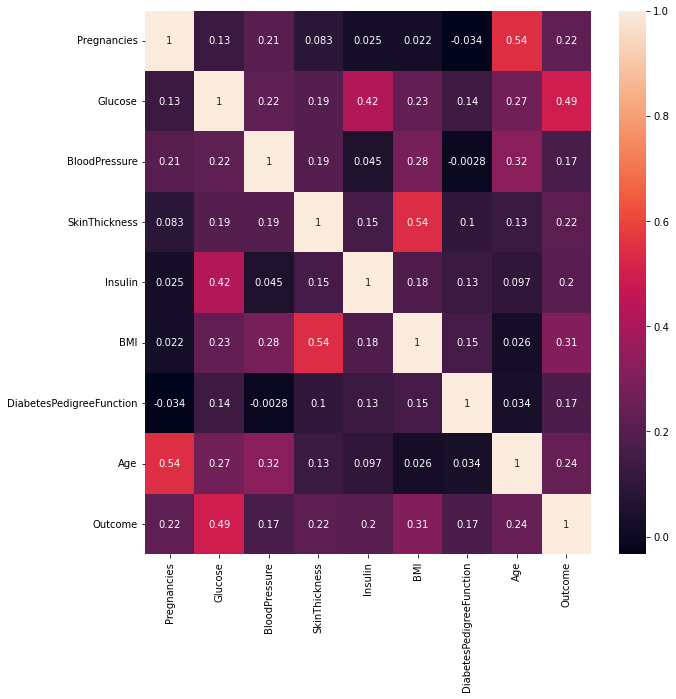

In [157]:
plt.figure(figsize=(10,10))
sns.heatmap(data=diabetes_copy.corr(), annot=True)

In [158]:
from sklearn.preprocessing import StandardScaler

In [159]:
p = StandardScaler()

In [160]:
x = diabetes_copy.drop('Outcome', axis = 1)

In [161]:
x.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148.0,72.0,35.00000,125.0,33.6,0.627,50
1,1,85.0,66.0,29.00000,125.0,26.6,0.351,31
2,8,183.0,64.0,29.15342,125.0,23.3,0.672,32
3,1,89.0,66.0,23.00000,94.0,28.1,0.167,21
4,0,137.0,40.0,35.00000,168.0,43.1,2.288,33


In [162]:
x.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,121.686763,72.405184,29.153420,140.671875,32.455208,0.471876,33.240885
std,3.369578,30.435949,12.096346,8.790942,86.383060,6.875177,0.331329,11.760232
min,0.000000,44.000000,24.000000,7.000000,14.000000,18.200000,0.078000,21.000000
25%,1.000000,99.750000,64.000000,25.000000,121.500000,27.500000,0.243750,24.000000
50%,3.000000,117.000000,72.202592,29.153420,125.000000,32.300000,0.372500,29.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000


In [163]:
X = p.fit_transform(x)

In [164]:
x = pd.DataFrame(X, columns= ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age'])

In [165]:
x.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
count,7.680000e+02,7.680000e+02,7.680000e+02,7.680000e+02,7.680000e+02,7.680000e+02,7.680000e+02,7.680000e+02
mean,2.544261e-17,-3.301757e-16,6.966722e-16,6.866252e-16,4.416317e-17,2.815312e-16,2.462585e-16,1.857600e-16
std,1.000652e+00,1.000652e+00,1.000652e+00,1.000652e+00,1.000652e+00,1.000652e+00,1.000652e+00,1.000652e+00
min,-1.141852e+00,-2.554131e+00,-4.004245e+00,-2.521670e+00,-1.467353e+00,-2.074783e+00,-1.189553e+00,-1.041549e+00
25%,-8.448851e-01,-7.212214e-01,-6.953060e-01,-4.727737e-01,-2.220849e-01,-7.212087e-01,-6.889685e-01,-7.862862e-01
50%,-2.509521e-01,-1.540881e-01,-1.675912e-02,8.087936e-16,-1.815412e-01,-2.258989e-02,-3.001282e-01,-3.608474e-01
75%,6.399473e-01,6.103090e-01,6.282695e-01,3.240194e-01,-1.554775e-01,6.032562e-01,4.662269e-01,6.602056e-01
max,3.906578e+00,2.541850e+00,4.102655e+00,7.950467e+00,8.170442e+00,5.042397e+00,5.883565e+00,4.063716e+00


In [166]:
y = diabetes_copy.Outcome

In [167]:
y

0      1
1      0
2      1
3      0
4      1
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 768, dtype: int64

In [168]:
from sklearn.model_selection import train_test_split

In [169]:
x_train, x_test, y_train, y_test = train_test_split(x, y, random_state=30, test_size=.2)

In [170]:
x_train.head(5)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
352,-0.250952,-1.995217,0.793716,-1.312910e-01,-0.181541,0.283056,-0.691234,1.085644
129,-1.141852,-0.548616,0.959163,8.087936e-16,-0.181541,-0.662990,0.812786,2.447048
387,1.233880,-0.548616,2.282739,7.793297e-01,-0.181541,1.578412,-0.703314,1.000557
244,-0.547919,0.799353,0.297376,6.655021e-01,0.617747,0.836129,-0.431503,-0.360847
366,0.639947,0.076053,-0.033518,8.087936e-16,-0.181541,-0.706654,-0.313719,-0.360847


In [171]:
y_train.head()

352    0
129    1
387    1
244    0
366    1
Name: Outcome, dtype: int64

In [172]:
from sklearn.neighbors import KNeighborsClassifier

In [173]:
train_score = []
test_score = []
for i in range(1,15):
        knn_class = KNeighborsClassifier(i)
        knn_class.fit(x_train, y_train)
        train_score.append(knn_class.score(x_train, y_train))
        test_score.append(knn_class.score(x_test,y_test))
        

In [174]:
print(train_score)

[1.0, 0.8485342019543974, 0.8583061889250815, 0.8403908794788274, 0.8175895765472313, 0.8159609120521173, 0.8224755700325733, 0.8078175895765473, 0.8159609120521173, 0.8094462540716613, 0.8175895765472313, 0.8094462540716613, 0.8094462540716613, 0.7947882736156352]


In [175]:
print(test_score)

[0.6428571428571429, 0.6753246753246753, 0.6818181818181818, 0.7077922077922078, 0.7207792207792207, 0.7272727272727273, 0.7272727272727273, 0.7402597402597403, 0.7662337662337663, 0.7402597402597403, 0.7532467532467533, 0.7337662337662337, 0.7532467532467533, 0.7532467532467533]


In [176]:
max_train_score = max(train_score)
index_train_score = [i for i, v in enumerate (train_score) if v == max_train_score]
print('the maximum train score is {} and the k value is {}'.format(max_train_score*100, list (map (lambda x: x+1, index_train_score ))))

the maximum train score is 100.0 and the k value is [1]


In [177]:
max_test_score = max(test_score)
index_test_score = [i for i, v in enumerate (test_score) if v == max_test_score]
print('the maximum test score is {}% and the value of k is {}'.format(max_test_score, list(map(lambda x: x+1, index_test_score))))

the maximum test score is 0.7662337662337663% and the value of k is [9]


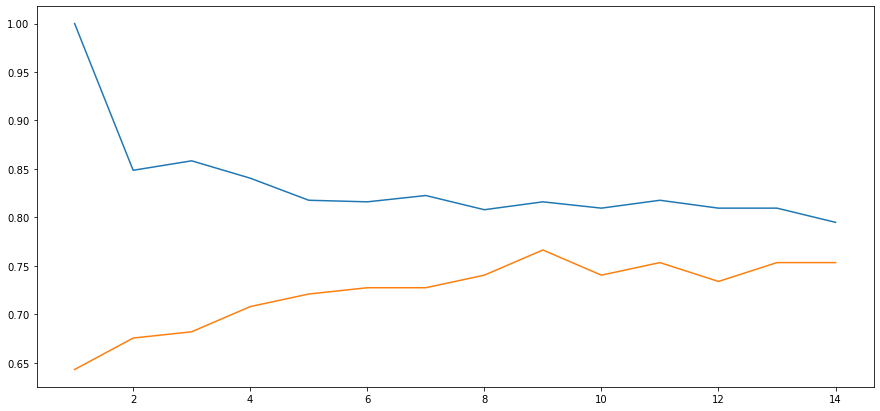

In [178]:
plt.figure(figsize=(15,7))
plt.plot(range(1,15), train_score)
plt.plot(range(1,15), test_score)
plt.show()

In [179]:
knn = KNeighborsClassifier(9)

In [182]:
knn.fit(x_test, y_test)

KNeighborsClassifier(n_neighbors=9)

In [183]:
y_pred = knn.predict(x_test)

In [184]:
from sklearn.metrics import confusion_matrix

In [185]:
pd.DataFrame(confusion_matrix(y_test, y_pred))

,0,1
0,95,9
1,21,29


In [186]:
pd.crosstab(y_test, y_pred, rownames=['predicted'], colnames=['actual'], margins= True)

actual,0,1,All
predicted,,,
0,95,9,104
1,21,29,50
All,116,38,154


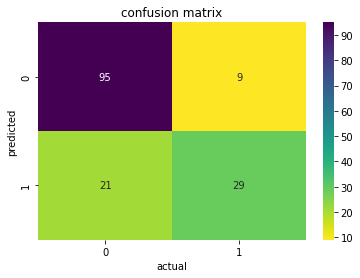

In [187]:
sns.heatmap(data= pd.DataFrame(confusion_matrix(y_test, y_pred)), annot=True, cmap='viridis_r')
plt.xlabel('actual')
plt.ylabel('predicted')
plt.title('confusion matrix')
plt.show()

In [188]:
from sklearn.metrics import classification_report

In [189]:
k = (classification_report(y_test, y_pred))

In [190]:
print(k)

              precision    recall  f1-score   support

           0       0.82      0.91      0.86       104
           1       0.76      0.58      0.66        50

    accuracy                           0.81       154
   macro avg       0.79      0.75      0.76       154
weighted avg       0.80      0.81      0.80       154



In [191]:
from sklearn.metrics import roc_curve

In [192]:
y_predict_proba = knn.predict_proba(x_test)[:, 1]

In [193]:
fpr, tpr, thresholds = roc_curve(y_test, y_predict_proba)

In [194]:
print ('FPR:', fpr)

FPR: [0.         0.         0.02884615 0.04807692 0.08653846 0.20192308
 0.28846154 0.51923077 0.76923077 1.        ]


In [195]:
print('TPR:', tpr)

TPR: [0.   0.1  0.28 0.46 0.58 0.68 0.88 0.98 1.   1.  ]


In [196]:
print('Thresholds:', thresholds)

Thresholds: [1.88888889 0.88888889 0.77777778 0.66666667 0.55555556 0.44444444
 0.33333333 0.22222222 0.11111111 0.        ]


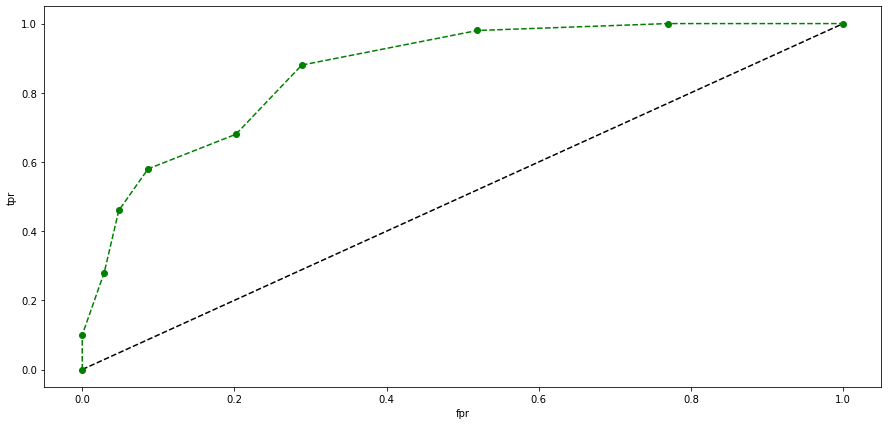

In [197]:
plt.figure(figsize=(15,7))
plt.plot([0,1], [0,1],'k--')
plt.plot(fpr, tpr, color='green', marker='o', linestyle='dashed')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.show()

In [198]:
from sklearn.metrics import roc_auc_score

In [199]:
roc_auc_score(y_test, y_predict_proba)

0.8656730769230769

In [200]:
from sklearn.model_selection import GridSearchCV

In [201]:
param_grid = {'n_neighbors': np.arange(1,20)}

knn = KNeighborsClassifier()

knn_cv = GridSearchCV(knn, param_grid, cv=10, verbose=True )

In [202]:
knn_cv.fit(x_test, y_test)

Fitting 10 folds for each of 19 candidates, totalling 190 fits


GridSearchCV(cv=10, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19])},
             verbose=True)

In [203]:
print ('best parameter: ', knn_cv.best_params_)

best parameter:  {'n_neighbors': 13}


In [204]:
print ('best score :', knn_cv.best_score_)

best score : 0.7654166666666666
